In [1]:
from __future__ import print_function
from skimage.transform import probabilistic_hough_line

%matplotlib inline
import scipy
from scipy import ndimage
from scipy import *
from pylab import *

import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual

import skimage
from skimage import *
from skimage import color
from skimage import exposure
from skimage import filters
from skimage import feature
from skimage import transform
from skimage import measure
from skimage.morphology import binary_dilation
import imageio
import cv2
import os
import time
import numpy as np

#plt.style.use('dark_background')

1 TACKA

Formira se funkcija segment_lines, ona služi da se na osnovu ulazne slike, izvrši segmentacije linija. Linije detektujemo na osnovu karakteristika kolor sistema. U ovom slučaju segmentacija se radi u HSV kolor sistemu, jer je tako lakše odrediti tačno opseg žute boje koju tražimo. <br/> 
Proces segmentacije:<br/>
Prvo vršimo proveru da li je ulazna slika img_in u RGB formatu, ukoliko nije vraćamo se na mesto poziva ove funkcije i ispisujemo obaveštenje korisniku da je potrebno dati sliku u odgovarajućem formatu. Nakon provere vršimo prebacivanje slike iz RGB kolor sistema u HSV. Nakon prebacivanja u HSV kolor sistem, izvlačimo H,S,V komponente. Prilikom formiranja maske prvo se formira maska za žutu liniju, zatim za belu i onda se one iskombinuju u konačnu masku.<br/> 
Img_out predstavlja izlaz funkcije, to je slika nastala množenjem ulazne slike i maske.

In [378]:
def segment_lanes(img_in):
    start=time.time()
    #provera ispravnosti ulaza
    if(len(img_in.shape)<3):
        print('Slika nije odgovarajucih dimenzija! Odgovarajuci format je RGB!')
        return
    
    [M,N]=shape(img_in[:,:,1])
    #prebacivanje RGB slike u sivu
    r, g, b = img_in[:,:,0], img_in[:,:,1], img_in[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    #potamnjivanje piksela slike stepenovanjem njihovog intenziteta
    gray=gray**15
    
    #izdvajanje HSV komponenti
    image_hsv=color.rgb2hsv(img_in)
    h= image_hsv[:,:,0]
    s= image_hsv[:,:,1]
    v= image_hsv[:,:,2]

    #Izdvajanje maske za zutu liniju
    zuta=zeros(shape(img_in[:,:,:]))
    for i in range(M):
        for j in range(N):
            if (h[i,j]>5/360 and h[i,j]<65/360) and (s[i,j]>50/100 and s[i,j]<85/100) and (v[i,j]>55/100 and v[i,j]<101/100) :
                zuta[i,j,:]=ones((3))
            else:
                zuta[i,j,:]=zeros((3))

    zuta_rgb=color.hsv2rgb(image_hsv*zuta) 
    
    #Izdvajanje maske za belu liniju
    bela=zeros(shape(img_in[:,:,:]))
    for i in range(M):
        for j in range(N):
            if v[i,j]>95/100  and s[i,j]<20/100:  
                bela[i,j,:]=ones((3))  
            else:
                bela[i,j,:]=zeros((3))

    bela_rgb=color.hsv2rgb(image_hsv*bela) 
    
    #formiranje konacne maske
    ukupno=zeros_like(zuta)
    ukupno[zuta==1]=1
    ukupno[bela==1]=1
    
    #Iscrtavanje HSV komponenti
    
    figure, axes=subplots(nrows=1,ncols=3,figsize=(10,16),dpi=120)
    ax=axes.ravel()
    ax[0].imshow(h, cmap='jet', vmin=0, vmax=1), ax[0].set_title('H komponenta', color='green'), ax[0].axis('off')
    ax[1].imshow(s, cmap='jet', vmin=0, vmax=1), ax[1].set_title('S komponenta', color='green'), ax[1].axis('off')
    ax[2].imshow(v, cmap='jet', vmin=0, vmax=1), ax[2].set_title('V komponenta', color='green'), ax[2].axis('off')
    matplotlib.pyplot.tight_layout()
    plt.show()
    
    #Iscrtavanje maski za zutu i belu liniju
    """
    figure, axes=subplots(nrows=1,ncols=3,figsize=(10,16),dpi=120)
    ax=axes.ravel()
    ax[0].imshow(img_in, cmap='gray', vmin=0, vmax=1), ax[0].set_title('Originalna slika', color='green'), ax[0].axis('off')
    ax[1].imshow(zuta, cmap='gray', vmin=0, vmax=1), ax[1].set_title('Zuta linija', color='green'), ax[1].axis('off')
    ax[2].imshow(bela, cmap='gray', vmin=0, vmax=1), ax[2].set_title('Bela linija', color='green'), ax[2].axis('off')
    matplotlib.pyplot.tight_layout()
    plt.show()
    """
    img_out=ukupno*img_in
    end=time.time()
    execution_time = (end - start)
    #print("\nVreme izvrsavanja fje segment_lanes: " + str(round(execution_time,3))+ "s \n")
    return img_out

Prikaz H,S i V komponenti test slika

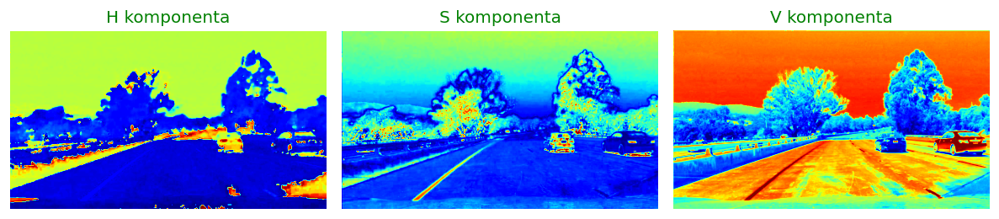

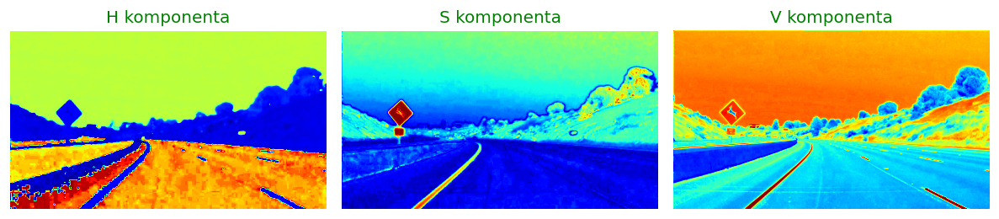

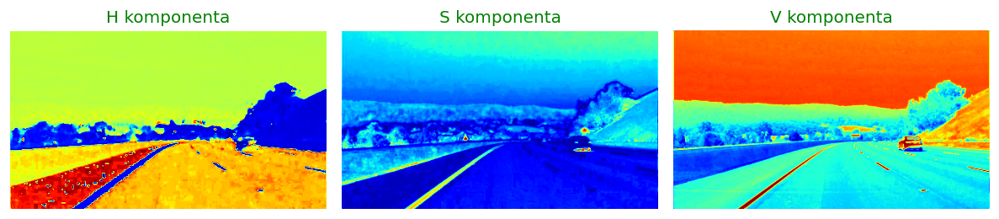

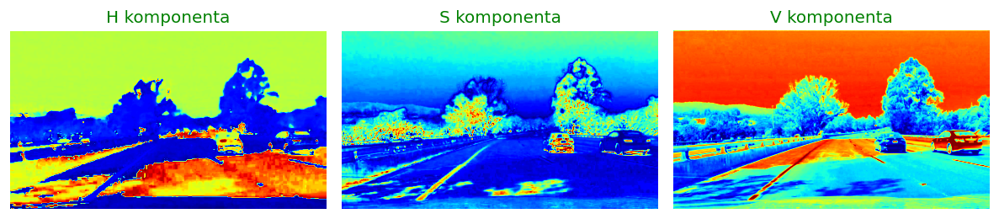

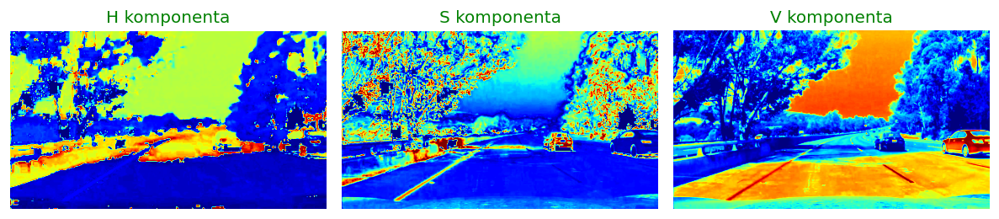

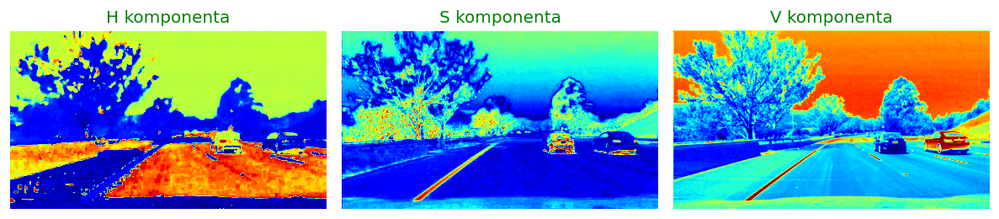

In [379]:
for i in range(0,6):
    f=img_as_float(imread('../sekvence/test_frames/test'+str(i+1)+'.jpg'))  
    g=segment_lanes(f)   

Prikaz maski žute i bele linije test slika

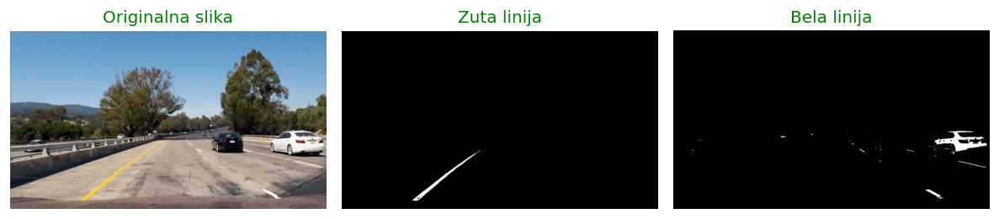

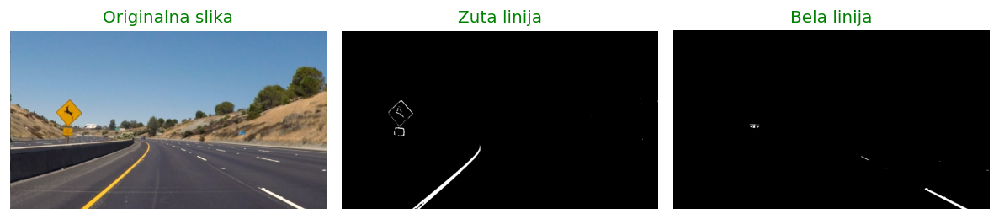

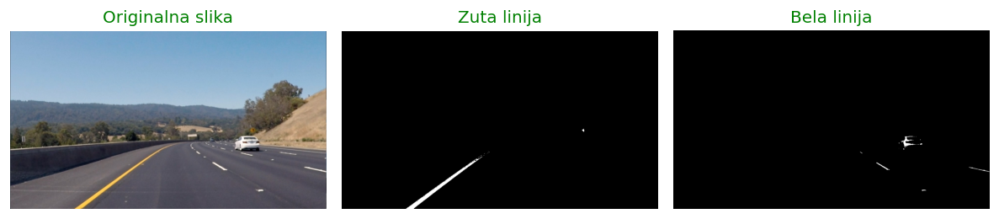

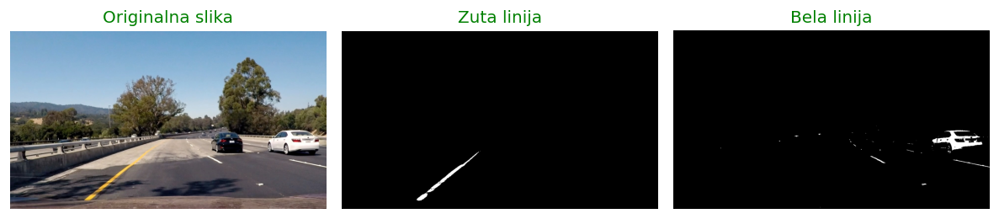

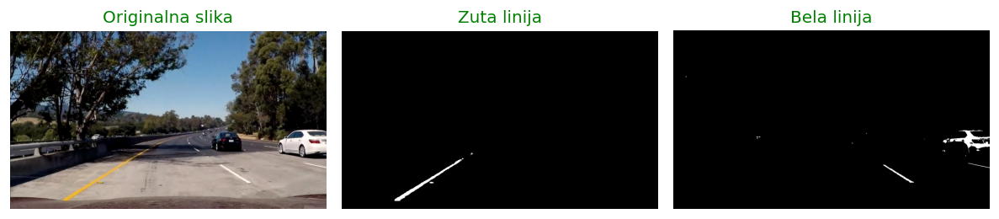

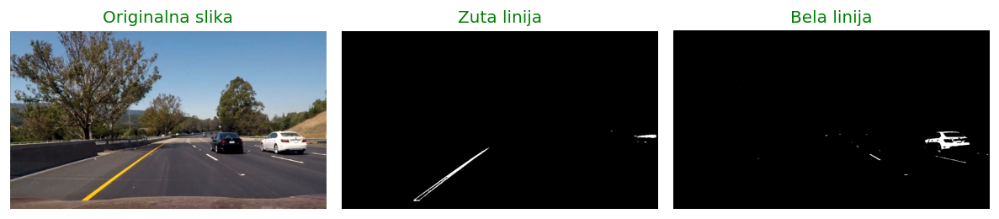

In [320]:
for i in range(0,6):
    f=img_as_float(imread('../sekvence/test_frames/test'+str(i+1)+'.jpg'))
    g=segment_lanes(f)    

Prikaz test slika i rezultata njihove segmentacije

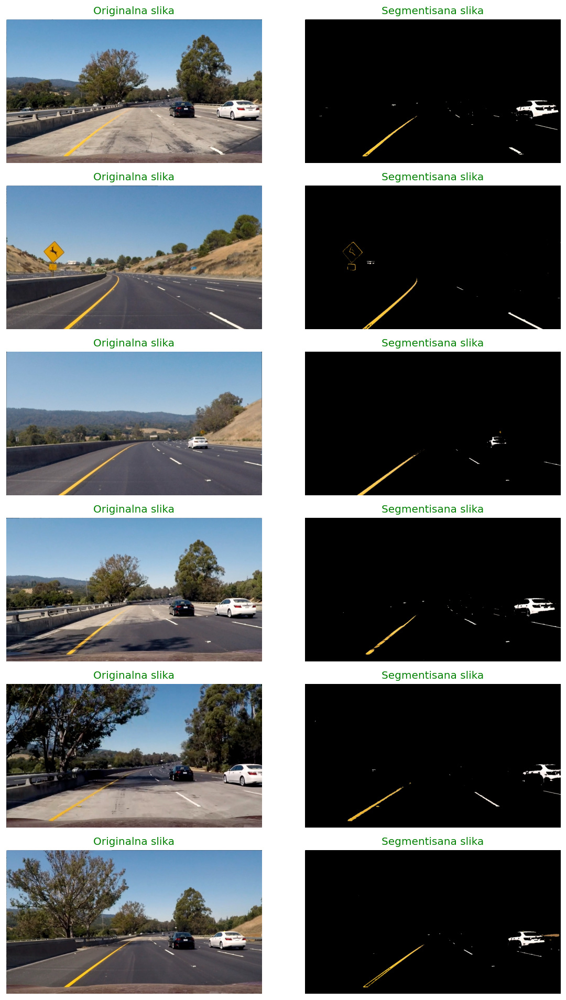

In [314]:
figure, ax=subplots(nrows=6,ncols=2,figsize=(10,16),dpi=120)
for i in range(0,6):
    f=img_as_float(imread('../sekvence/test_frames/test'+str(i+1)+'.jpg'))
    g=segment_lanes(f)

    ax[i,0].imshow(f, cmap='gray', vmin=0, vmax=1), ax[i,0].set_title('Originalna slika', color='green'), ax[i,0].axis('off')
    ax[i,1].imshow(g, cmap='gray', vmin=0, vmax=1), ax[i,1].set_title('Segmentisana slika', color='green'), ax[i,1].axis('off')
    matplotlib.pyplot.tight_layout()

2 TACKA

Umesto ugrađene kani funkcije koristimo funkciju canny_edge_detection. Ona za ulazne argumente ima: ulaznu sliku (img_in), sigma, kao i nizak i visok prag, trL i trH, respektivno. <br/>
Rad funkcije:<br/>
Potrebno je prvo ulaznu sliku provući kroz Gausov filtar, time uklanjamo određene detalje sa te slike. Zatim , koristeći Sobelov operator, računamo horizontalni i vertikalni gradijent te slike. Na osnovu izračunatih gradijenata, računa se magnituda i ugao gradijenta. Nakon što smo ovo odradili, potrebno je izvršiti non-max supression. To radimo tako što prvo odredimo ugao, tako što ga diskretizujemo na 4 moguće vrednosti (-45, 0 , 45 , 90). U zavisnosti od toga o kom uglu je reč, zavisi i koje ćemo piksele iz lokalnog okruženja posmatrati prilikom traženja maksimuma. <br/>
Nakon izvršene non-max supresije, potrebno je odrediti slabe i jake ivice. Njih određujemo poređenjem sa pragovima trL i trH. Ukoliko je piksel veći od trH on sigurno čini jaku ivicu, ako je manji od trL tada taj piksel sigurno ne čini ivicu. Pikseli koji se nalaze između trL i trH, spadaju u slabu ivicu, tj za njih nismo sigurni da li pripadaju ivici ili ne. Za njih je potrebno izvršiti dodatnu proveru gde gledamo da li su ti pikseli u okruženju jakih ivičnih piksela ili nisu, ukoliko jesu onda i ti pikseli postaju delovi jake ivice, ako nisu onda se brišu i iz slabe ivice.

Formiranje Keni algoritma

In [354]:
def canny_edge_detection(img_in,sigma,trL,trH):
    start=time.time()
    #Prvo treba izvrsiti filtriranje slike Gausovom fjom
    img_filt=filters.gaussian(img_in, sigma, mode='nearest', truncate=3)
    
    #Pravljenje gradijenta pomocu Sobelovog operatora
    Hx = np.array([[-1, -2, -1],[0, 0, 0],[1, 2, 1]])
    Hy = np.transpose(Hx)

    # izracunavanje vertikalnog i horizontalnog gradijenta slike
    Gx = scipy.ndimage.correlate(img_filt, Hx, mode='nearest')
    Gy = scipy.ndimage.correlate(img_filt, Hy, mode='nearest')

    #Odredjivanje magnitude i ugla gradijenta
    mag=np.sqrt(np.square(Gx)+np.square(Gy))
    angle=np.arctan2(Gy,Gx)
    angle_deg=np.rad2deg(angle)
    #Koriscenje non-max suppression algoritma u zavisnosti od smera gradijenta 
    [M,N]=shape(img_in)
    G=zeros((M,N))
    angle_deg[angle_deg<0]+=180
    
    angle_deg_pad = np.zeros((M+2,N+2))
    angle_deg_pad[1:M+1,1:N+1] = angle_deg
    mag_pad = np.zeros((M+2,N+2))
    mag_pad[1:M+1,1:N+1] = mag
    
    
    #diskretizacija ugla 
    for i in range(1,M+1):
         for j in range(1,N+1):
                #ugao 0
                if (0 <= angle_deg_pad[i,j] < 22.5) or (157.5 <= angle_deg_pad[i,j] <= 180):
                    pret = mag_pad[i+1, j]
                    sled = mag_pad[i-1, j]
                #ugao 45
                elif (22.5 <= angle_deg_pad[i,j] < 67.5):
                    sled = mag_pad[i-1, j-1]
                    pret = mag_pad[i+1, j+1]
                #ugao 90
                elif (67.5 <= angle_deg_pad[i,j] < 112.5):
                    pret = mag_pad[i, j+1]
                    sled = mag_pad[i, j-1]
                #ugao 135
                elif (112.5 <= angle_deg_pad[i,j] < 157.5):
                    pret = mag_pad[i+1, j-1]
                    sled = mag_pad[i-1, j+1]

                if (mag_pad[i,j] >= pret) and (mag_pad[i,j] >= sled):
                    G[i-1,j-1] = mag_pad[i,j]
                else:
                    G[i-1,j-1] = 0

         
    #Koriscenje nizeg i viseg praga
    #Nalazenje indeksa koji su veci od trH
    strong_i,strong_j=np.where(G>=trH)
         
    #Nalazenje indeksa koji su manji od trL
    zeros_i,zeros_j=np.where(G<trL)
         
    #Nalazenje indeksa koji su izmedju trL i trH
    weak_i,weak_j=np.where((G>=trL) & (G<=trH))
    
    StrongEdges = np.zeros((M+2,N+2))
    WeakEdges = np.zeros((M+2,N+2))
    StrongEdges[1:M+1,1:N+1] = (G>=trH).astype(int)
    WeakEdges[1:M+1,1:N+1] = ((G>=trL) & (G<trH)).astype(int)
    
    # Spajanje slabih ivica sa jakim
    flag = True
    while(flag):
        flag = False
        for i in range(1,M+1):
            for j in range(1,N+1):
                if(WeakEdges[i,j]):
                    if(np.sum(StrongEdges[(i-1):(i+2),(j-1):(j+1)]) > 0):
                        StrongEdges[i,j] = 1;
                        WeakEdges[i,j] = 0;
                        flag = True
    
    #prikaz medjurezultata
    """
    figure, axes=subplots(nrows=3,ncols=2,figsize=(18,16),dpi=120)
    ax=axes.ravel()
    ax[0].imshow(Gx, cmap='gray', vmin=0, vmax=1), ax[0].set_title('Vertikalni gradijent', color='green',fontsize= 25), ax[0].axis('off')
    ax[1].imshow(Gy, cmap='gray', vmin=0, vmax=1), ax[1].set_title('Horizontalni gradijent', color='green',fontsize= 25), ax[1].axis('off')
    ax[2].imshow(mag, cmap='gray', vmin=0, vmax=1), ax[2].set_title('Magnituda gradijenta', color='green',fontsize= 25), ax[2].axis('off')
    ax[3].imshow(angle, cmap='jet', vmin=0, vmax=1), ax[3].set_title('Ugao gradijenta', color='green',fontsize= 25), ax[3].axis('off')
    ax[4].imshow(G, cmap='gray', vmin=0, vmax=1), ax[4].set_title('Non-max supression', color='green',fontsize= 25), ax[4].axis('off')
    ax[5].imshow(StrongEdges[1:M+1,1:N+1] , cmap='gray', vmin=0, vmax=1), ax[5].set_title('Konacne ivice', color='green',fontsize= 25), ax[5].axis('off')
    matplotlib.pyplot.tight_layout()
    plt.show()
    """
    end = time.time()
    execution_time = (end - start)
    #print("\nVreme izvrsavanja Kani fje: " + str(round(execution_time,3))+ "s \n")
 
    return StrongEdges[1:M+1,1:N+1] 

Prikaz međurezultata

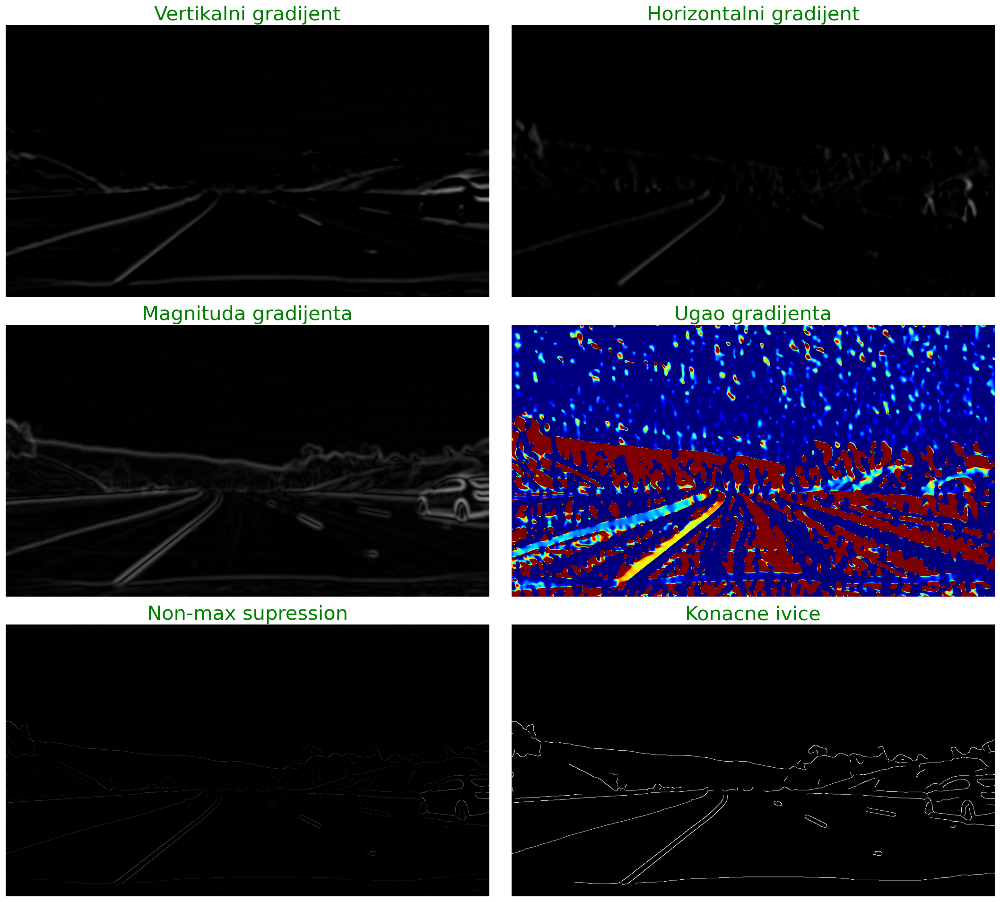

In [353]:
f=img_as_float(imread('../sekvence/data/frame'+str(185)+'.jpg'))
f_gray=skimage.color.rgb2gray(f)
sigma=5
trL=0.05
trH=0.09
G=canny_edge_detection(f_gray,sigma,trL,trH) 

Poređenje napisane i ugrađene Kani funkcije

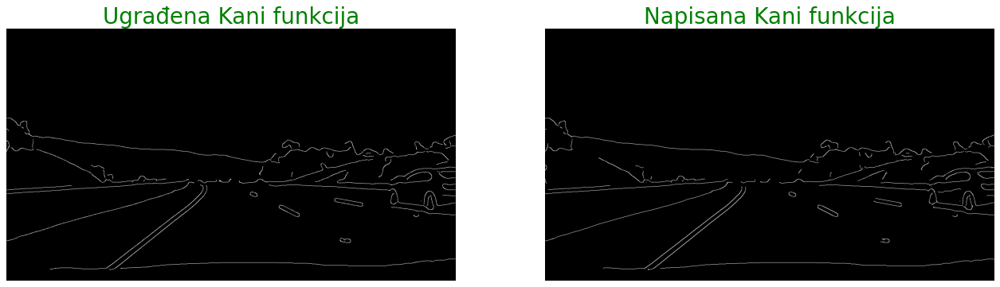

In [355]:
f=img_as_float(imread('../sekvence/data/frame'+str(185)+'.jpg'))
f_gray=skimage.color.rgb2gray(f)
sigma=5
trL=0.05
trH=0.09
F = skimage.feature.canny(f_gray, sigma=sigma, low_threshold=trL, high_threshold=trH)
    
G=canny_edge_detection(f_gray,sigma,trL,trH) 

figure, axes=subplots(nrows=1,ncols=2,figsize=(20,16),dpi=80)
ax=axes.ravel()
ax[0].imshow(F, cmap='gray', vmin=0, vmax=1), ax[0].set_title('Ugrađena Kani funkcija', color='green',fontsize= 25), ax[0].axis('off')
ax[1].imshow(G, cmap='gray', vmin=0, vmax=1), ax[1].set_title('Napisana Kani funkcija', color='green',fontsize= 25), ax[1].axis('off')
plt.show()

Prikaz Kanija za različite parametre.<br/>
Na sledećim slikama vidimo da kada se parametara trL povećava, tada se sve veći broj ivica odbacuje, takođe i povećanjem trH će biti manji broj jakih ivica, a samim tim i manji ukupan broj ivica.

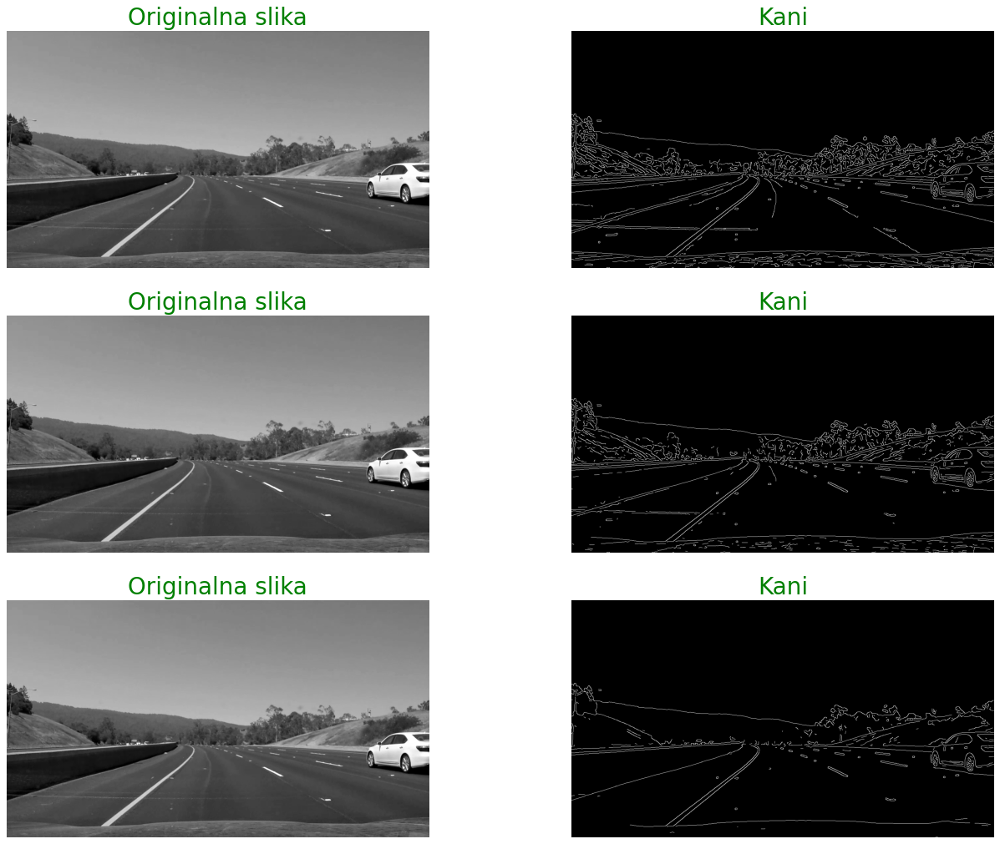

In [356]:
f=img_as_float(imread('./data/frame'+str(185)+'.jpg'))
f_gray=skimage.color.rgb2gray(f)
sigma=2
trL=[0.02, 0.07, 0.15]
trH=[0.07, 0.09, 0.19]

figure, ax=subplots(nrows=3,ncols=2,figsize=(20,16),dpi=80)
for i in range(0,3):
    G=canny_edge_detection(f_gray,sigma,trL[i],trH[i]) 

    ax[i,0].imshow(f_gray, cmap='gray', vmin=0, vmax=1), ax[i,0].set_title('Originalna slika', color='green',fontsize= 25), ax[i,0].axis('off')
    ax[i,1].imshow(G, cmap='gray', vmin=0, vmax=1), ax[i,1].set_title('Kani', color='green',fontsize= 25), ax[i,1].axis('off')
plt.show()

Primena Kanija na sve segmentisane test slike

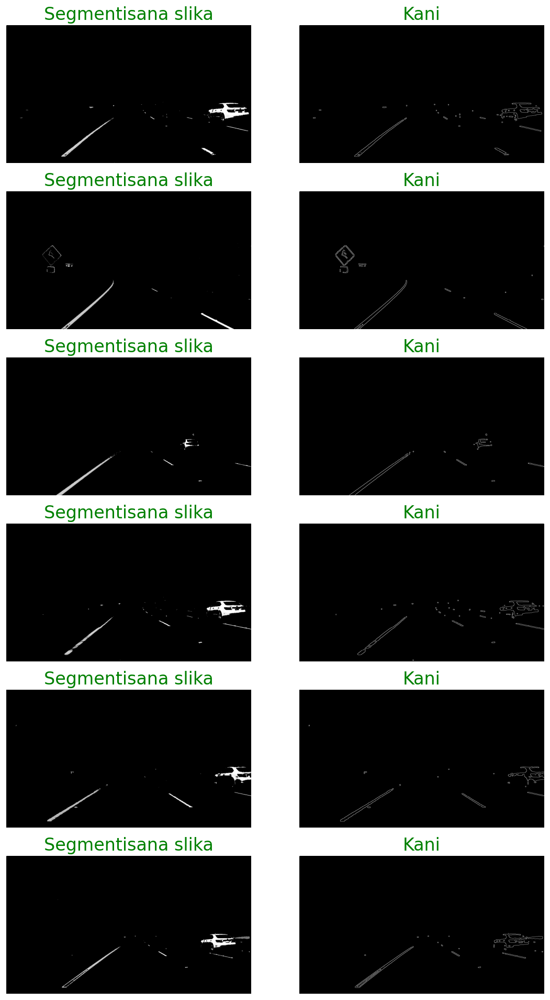

In [361]:
trL=0.05
trH=0.09
sigma=2
figure, ax=subplots(nrows=6,ncols=2,figsize=(10,16),dpi=120)
for i in range(0,6):
    f=img_as_float(imread('../sekvence/test_frames/test'+str(i+1)+'.jpg'))
    g=segment_lanes(f)
    r, g, b = g[:,:,0], g[:,:,1], g[:,:,2]
    g_gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
   
    G=canny_edge_detection(g_gray,sigma,trL,trH) 
    
    ax[i,0].imshow(g, cmap='gray', vmin=0, vmax=1), ax[i,0].set_title('Segmentisana slika', color='green',fontsize= 20), ax[i,0].axis('off')
    ax[i,1].imshow(G, cmap='gray', vmin=0, vmax=1), ax[i,1].set_title('Kani', color='green',fontsize= 20), ax[i,1].axis('off')
    matplotlib.pyplot.tight_layout()

3 TACKA

Funkcija get_line_segments na osnovu ulazne slike na izlazu daje sve duži od interesa koje se na toj slici nalaze. Ulazni parametri ove funkcije su: <br/> 
Ulazna slika na kojoj se nalaze izdvojene ivice, tj. to je slika koja se dobija primenom Kani algoritma.  <br/>
Linija tj. prava, ona se zadaje u vidu dva parametra, ugla i potega. Nju dobijamo tako što primenimo Hafovu transformaciju. Ona nam daje sve prave na slici, a onda izdvojimo samo pravu koja nas interesuje i nju prosledimo funkciji. <br/>
Minimalna veličina duži, sve duži koje su manje od ovoga bivaju odbačene tj. njih nećemo sačuvati. <br/>
Maksimalni prekid, pretstavlja najveći prekid koju neka duž može da sadrži. Ukoliko je prekid veći od maksimalnog onda će duž biti prekinuta i njen kraj će biti tačka pre početka tog prekida. <br/>
Tolerancija, ona označava veličinu okoline oko prave gde tražimo piksele koji čine saobraćajnu traku. <br/>
<br/>
Izlaz ove funkcije predstavlju sve duži koje su nađene oko zadate prave. Ove duži vraćamo u vidu dve matrice, početak i kraj. Matrica početak sadrži sve tačke (x,y), koje pretstavljaju početke svake duži, a matrica kraj sadrži sve tačke koje pretstavljaju njhove krajeve.


In [364]:
def get_line_segments(img_edges,line,min_size,max_gaps,tolerancy):
    start=time.time()
    M,N=shape(img_edges)
    r=tolerancy

    rho=line[0,0]
    teta=line[0,1]
    
    #dimenzije prosirene slike
    Mp=M+2*r
    Np=N+2*r
    img_extend=zeros((Mp,Np))
    #Popunjavanje prosirene slike
    img_extend[r:(M+r),r:(N+r)]=img_edges
    
    #inicijalizacija
    poc_koor=np.zeros((1,2))  #(x,y)
    krajnje_koor=np.zeros((1,2))
    ukupan_poc=np.zeros((1,2))  #(x,y)
    ukupan_kraj=np.zeros((1,2))
    
    pocetak_search=1 #dok je na 1 jos uvek nismo nasli pocetak duzi
    gap=0
    size=0
    gap_search=0   
    for i in range(0,N):
        x=i
        y=(rho-x*np.cos(teta))/np.sin(teta)
        y=round(y)  #zaokruzuje se zbog kasnijeg indeksiranja slike
        if(y>=0 and y<=Mp):
            if (sum(img_extend[y:y+2*r,x-r:x+r])==0 and pocetak_search==0): #nema nijedan piksel u okruzenju, a vec imamo pocetak ove duzi 
                if(gap_search==1): #ukoliko smo tek sad naisli na prekid ulazi se ovde
                    gap_search=0
                    pocetak_gap=[x,y]   #pamti se pocetak prekida jer se u odnosu na njega racuna max_gap
                gap=np.sqrt(np.square(pocetak_gap[0]-x)+np.square(pocetak_gap[1]-y))  #racunanje trenutne duzine prekida


            if (sum(img_extend[y:y+2*r,x-r:x+r])>=1 and pocetak_search==1): #ukoliko je makar jedan piksel beo i ukoliko jos uvek trazimo pocetak duzi
                pocetak_search=0
                gap_search=1
                poc_koor=np.array([[x, y]])
                
            if (sum(img_extend[y:y+2*r,x-r:x+r])>=1 and pocetak_search==0): #ukoliko je makar jedan piksel beo i ukolko je vec nadjen pocetak duzi
                size=size+1          #povecava se duzina duzi
                gap_search=1     #opet moze da se krene sa trazenjem prekida

            if (gap>max_gaps or y==M-1+r or x==N-1):  #prekidanje duzi
                gap=0
                pocetak_search=1
                if(size>=min_size): #samo ukoliko je duzina duzi veca od min_size memorisemo njen kraj
                    x_kr=pocetak_gap[0]   #krajnja tacka duzi je pocetak prekida
                    y_kr=pocetak_gap[1]
                    krajnje_koor=np.array([[x_kr, y_kr]])
                    ukupan_poc=np.concatenate((ukupan_poc,poc_koor), axis=0)  #dodaje se na ostale pocetke
                    ukupan_kraj=np.concatenate((ukupan_kraj,krajnje_koor), axis=0)  #dodaje se na ostale krajeve
                size=0

    end = time.time()
    execution_time = (end - start)
    #print("\nVreme izvrsavanja get_line_segments: " + str(round(execution_time,3))+ "s \n")
 
    return ukupan_poc[1::,:], ukupan_kraj[1::,:]
    

4 TACKA

Funkcija lane_detection kao ulazni argument prima sliku, a na izlazu vraća tačke početka i kraj dve duži, koje pretstavljaju levu i desnu kolovoznu traku. <br/>
Ovde se objedinjuju sve do sada definisane funkcije. Prvo se izvrši segmentacija ulazne slike, zatim se izvrši Kani transformacija. Nakon sto smo dobili sliku sa izraženim ivicama, potrebno je naći pravu preko Hafove transformacije. Da bi se olakšalo nalaženje željenih prava, u startu je zadat opseg uglova linija koje se traže u Hafovoj transformaciji. Na kraju na osnovu dobijenih prava, vršimo dodatno izdvajanje na osnovu dužine potega, koji je karakterističan za levu i desnu liniju.
<br/>
Nakon sto su izdvojeni parametri prava, pozivamo funkciju get_line_segments za te parametre. Ona vraća sve duži koje se nalaze na tom pravcu, a zatim odatle izvlačimo maksimalnu.

In [369]:
def lane_detection(frame):
    start=time.time()
    segmentation=segment_lanes(frame)
    segmentation_gray=skimage.color.rgb2gray(segmentation) #prelazak u sivu sliku
    sigma=2
    trL=0.05
    trH=0.09
    canny_image=canny_edge_detection(segmentation_gray,sigma,trL,trH)
    
    #Određivanje opsega uglova za Hafa
    angles_l = np.linspace(0.8,1.1,1000)
    angles_r = np.linspace(-np.pi/2,-np.pi/4,1000)

    #Hafova trans za levu traku
    [out, angles, distances] = skimage.transform.hough_line(canny_image,angles_l)
    [intensity, peak_angles, peak_distances] = skimage.transform.hough_line_peaks(out, angles, distances, min_distance=1, min_angle=0, threshold=0.3*max(out.flatten()), num_peaks=25)
    ugao_l=peak_angles[np.where(np.logical_and(peak_distances>690, peak_distances<750))]
    rho_l=peak_distances[np.where(np.logical_and(peak_distances>690, peak_distances<750))]
    
    #Hafova trans za desnu traku
    [out, angles, distances] = skimage.transform.hough_line(canny_image,angles_r)
    [intensity, peak_angles, peak_distances] = skimage.transform.hough_line_peaks(out, angles, distances, min_distance=1, min_angle=0, threshold=0.3*max(out.flatten()), num_peaks=25)
    ugao_r=peak_angles[np.where(np.logical_and(peak_distances>-100, peak_distances<60))]
    rho_r=peak_distances[np.where(np.logical_and(peak_distances>-100, peak_distances<60))]
    
    if(any(rho_l)): #ulazi se ukoliko rho_l nije prazan niz
        pocetak_l, kraj_l=get_line_segments(canny_image,np.array([[mean(rho_l) , mean(ugao_l)]]), 2, 5, 8)
        duz_l=np.sqrt(np.square(pocetak_l[:,0]-kraj_l[:,0])+np.square(pocetak_l[:,1]-kraj_l[:,1]))
        
        if(not any(duz_l)):  #ukoliko je duz_l prazan niz za pocetak i kraj duzi se uzima u koor pocetku
            pocetak_l_konacno=np.zeros(2)
            kraj_l_konacno=np.zeros(2)
        else:                #ukoliko je nadjeno vise duzi onda se uzima ona koja je najduza
            ind_l=np.argmax(duz_l)
            pocetak_l_konacno=pocetak_l[ind_l,:]
            kraj_l_konacno=kraj_l[ind_l,:]

    else: #ukoliko Hafova trans nije nasla nijednu pravu u zadatom opsegu
        pocetak_l_konacno=np.zeros(2)
        kraj_l_konacno=np.zeros(2)
    
    #za desnu liniju se gleda iste stvari kao za levu
    if(any(rho_r)):
        pocetak_r, kraj_r=get_line_segments(canny_image,np.array([[mean(rho_r) , mean(ugao_r)]]), 2, 5, 8)
        duz_r=np.sqrt(np.square(pocetak_r[:,0]-kraj_r[:,0])+np.square(pocetak_r[:,1]-kraj_r[:,1]))
       
        if(not any(duz_r)):
            pocetak=np.stack([pocetak_l_konacno,np.zeros(2)])
            kraj=np.stack([kraj_l_konacno,np.zeros(2)])
        else:
            ind_r=np.argmax(duz_r)
            pocetak=np.stack([pocetak_l_konacno,pocetak_r[ind_r,:]])
            kraj=np.stack([kraj_l_konacno,kraj_r[ind_r,:]])

    else:
        pocetak=np.stack([pocetak_l_konacno,np.zeros(2)])
        kraj=np.stack([kraj_l_konacno,np.zeros(2)])
     
    
    #iscrtavanje svih medjukoraka ove funkcije  
    
    figure, axes=subplots(nrows=3,ncols=2,figsize=(18,16),dpi=120)
    ax=axes.ravel()
    ax[0].imshow(canny_image, cmap=plt.cm.gray)
    ax[0].set_title('Hafova transformacija leve linije', color='green',fontsize= 25)
    origin = np.array((0, canny_image.shape[1]))
    y0, y1 = (mean(rho_l) - origin * np.cos(mean(ugao_l))) / np.sin(mean(ugao_l))
    ax[0].plot(origin, (y0, y1), '-r')
    ax[0].set_xlim(origin)
    ax[0].set_ylim((canny_image.shape[0], 0))
    ax[0].set_axis_off()
    
    ax[1].imshow(canny_image, cmap=plt.cm.gray)
    ax[1].set_title('Hafova transformacija desne linije', color='green',fontsize= 25)
    origin = np.array((0, canny_image.shape[1]))
    y0, y1 = (mean(rho_r) - origin * np.cos(mean(ugao_r))) / np.sin(mean(ugao_r))
    ax[1].plot(origin, (y0, y1), '-r')
    ax[1].set_xlim(origin)
    ax[1].set_ylim((canny_image.shape[0], 0))
    ax[1].set_axis_off()
    
    if(any(rho_l)):
        for i in range(0,len(pocetak_l[:,1])):
            ax[2].plot([pocetak_l[i,0], kraj_l[i,0]], [pocetak_l[i,1], kraj_l[i,1]], '-b')
    ax[2].imshow(canny_image,cmap='gray')
    ax[2].axis('off')
    ax[2].set_title('Sve duzi leve linije', color='green',fontsize= 25)
    if(any(rho_r)):
        for i in range(0,len(pocetak_r[:,1])):
            ax[3].plot([pocetak_r[i,0], kraj_r[i,0]], [pocetak_r[i,1], kraj_r[i,1]], '-b')
    ax[3].imshow(canny_image,cmap='gray')
    ax[3].axis('off')
    ax[3].set_title('Sve duzi desne linije', color='green',fontsize= 25)
     #iscrtavanje leve linije
    dot1=(int64(pocetak[0,0]),int64(pocetak[0,1]))
    dot2=(int64(kraj[0,0]),int64(kraj[0,1]))
    e=cv2.line(canny_image*255, dot1, dot2, (255,0,0), 10)
    e_copy=np.uint8(e)
    ax[4].imshow(e_copy, cmap='gray', vmin=0, vmax=255), ax[4].set_title('Najduza duz leve linije', color='green',fontsize= 25), ax[4].axis('off')
    

    #iscrtavanje desne linije
    dot1=(int64(pocetak[1,0]),int64(pocetak[1,1]))
    dot2=(int64(kraj[1,0]),int64(kraj[1,1]))
    e=cv2.line(canny_image*255, dot1, dot2, (255,0,0), 10)
    e_copy=np.uint8(e)
    ax[5].imshow(e_copy, cmap='gray', vmin=0, vmax=255), ax[5].set_title('Najduza duz desne linije', color='green',fontsize= 25), ax[5].axis('off')
    
    matplotlib.pyplot.tight_layout()
    plt.show()
    
    end = time.time()
    execution_time = (end - start)
    #print("\nVreme izvrsavanja fje lane_detection: " + str(round(execution_time,3))+ "s \n")
  
    return pocetak,kraj

Prikaz međukoraka na svim test slikama

1. test frejm


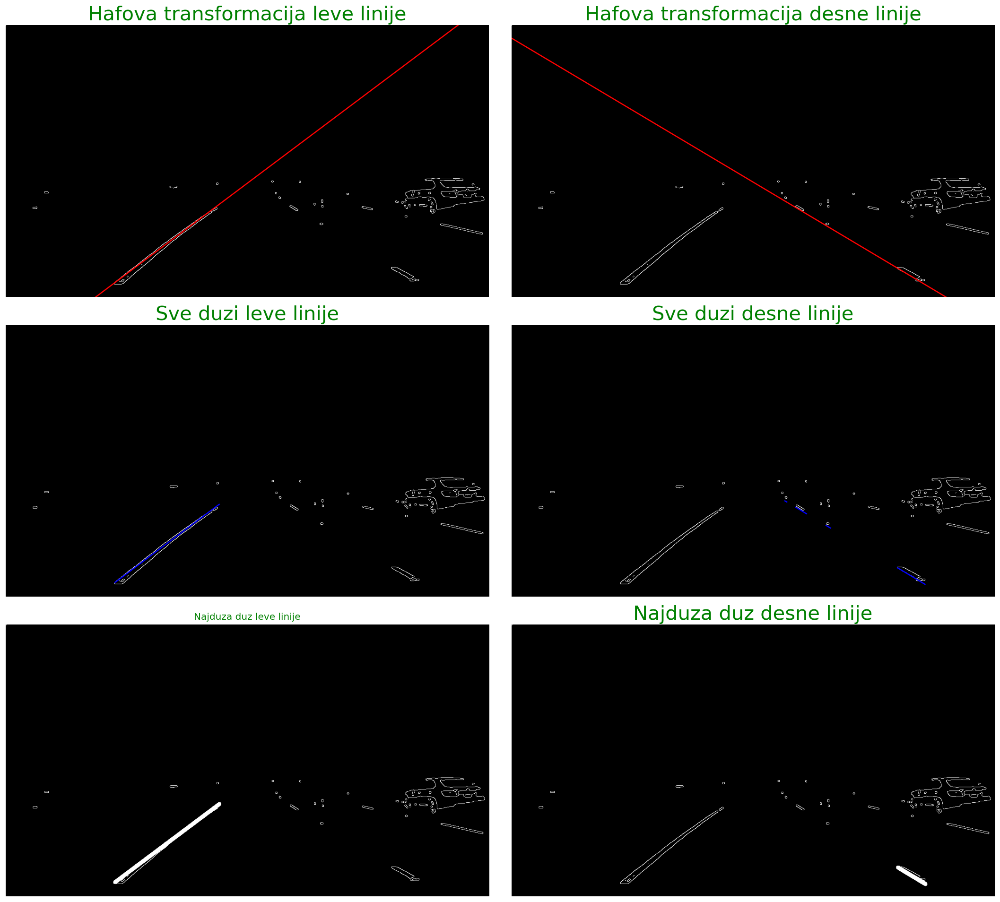

2. test frejm


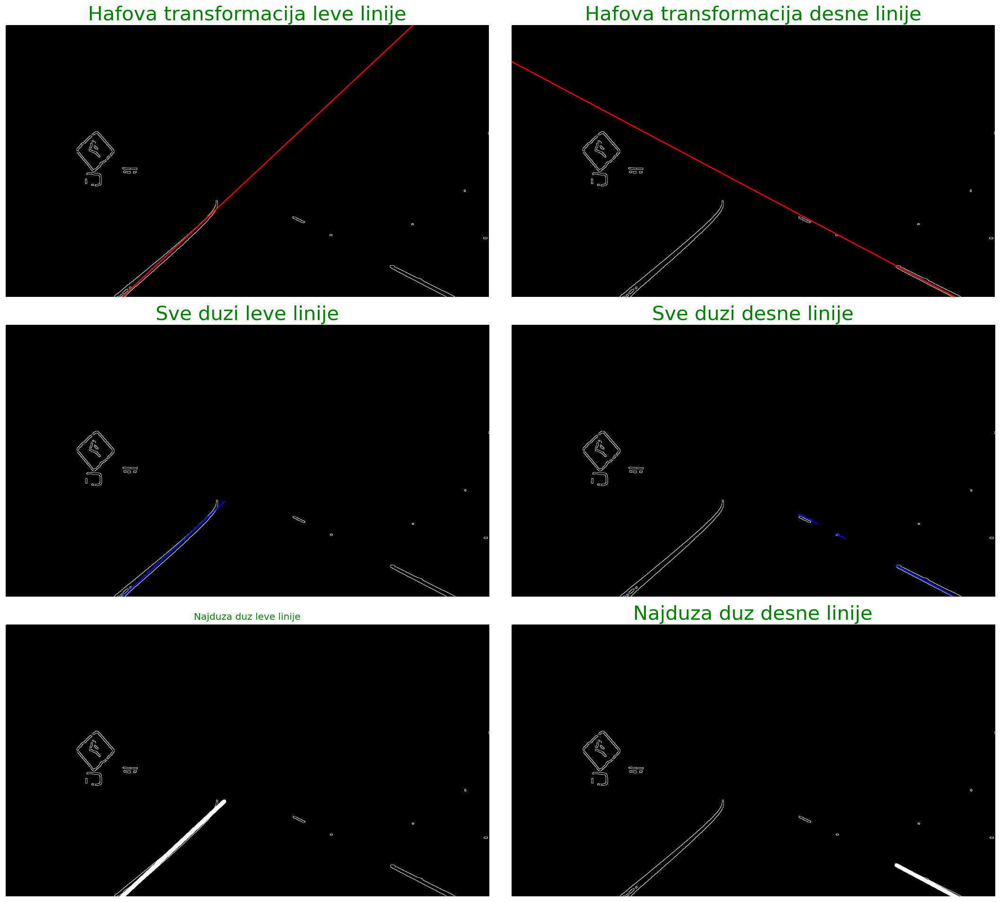

3. test frejm


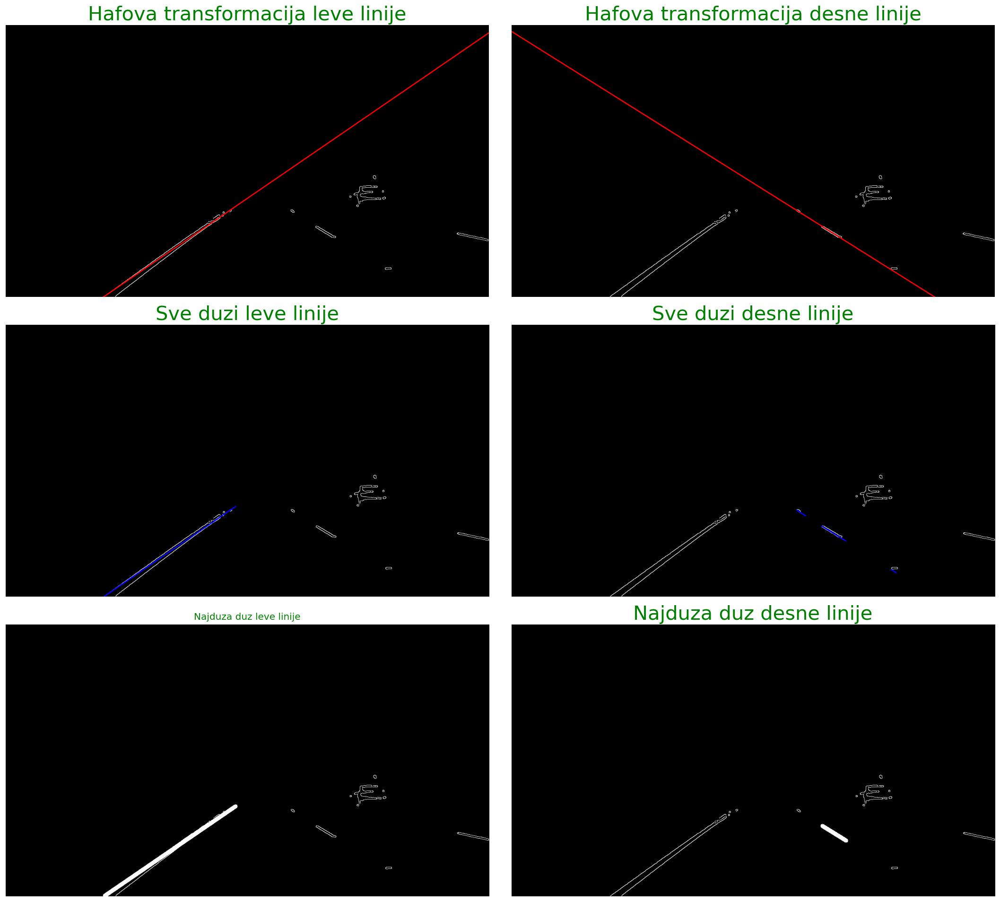

4. test frejm


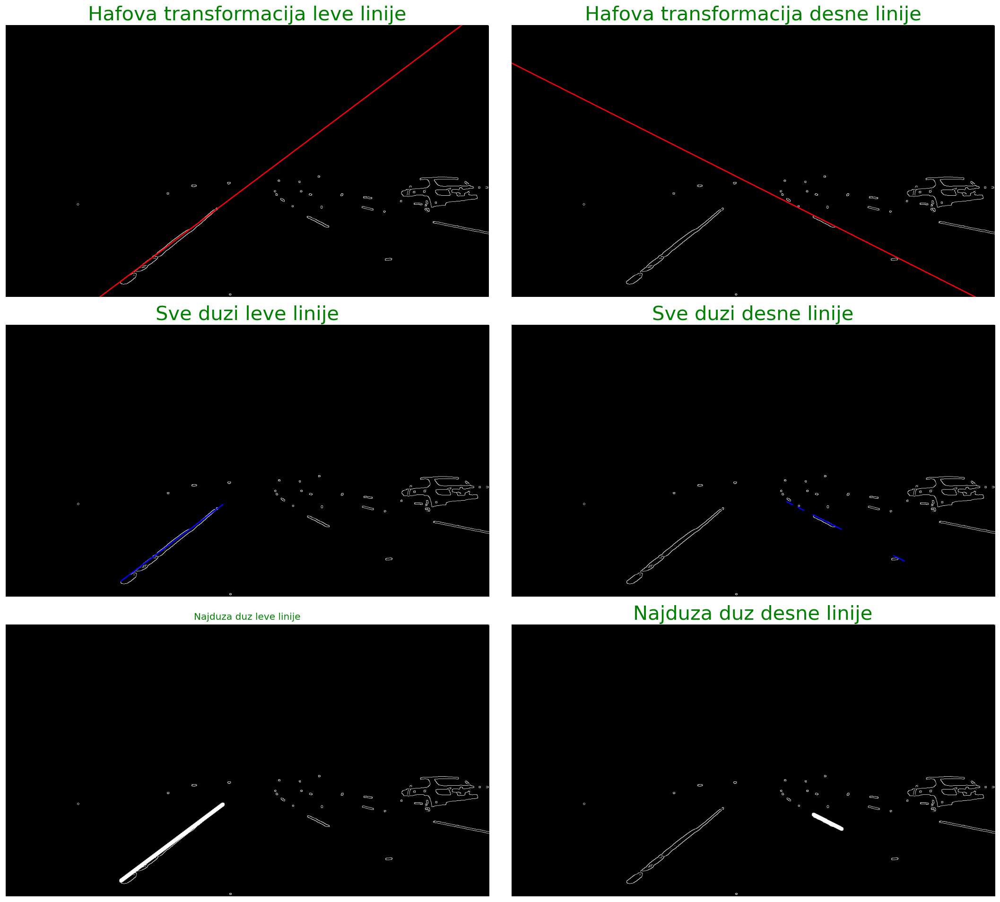

5. test frejm


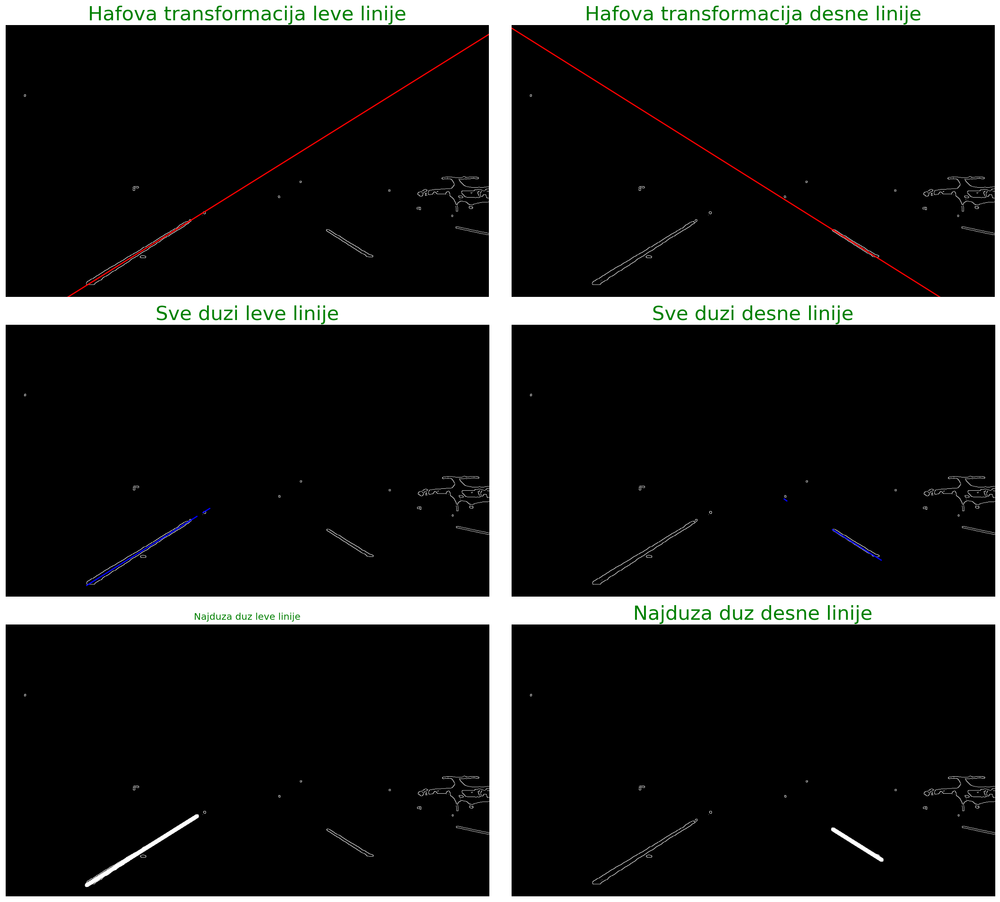

6. test frejm


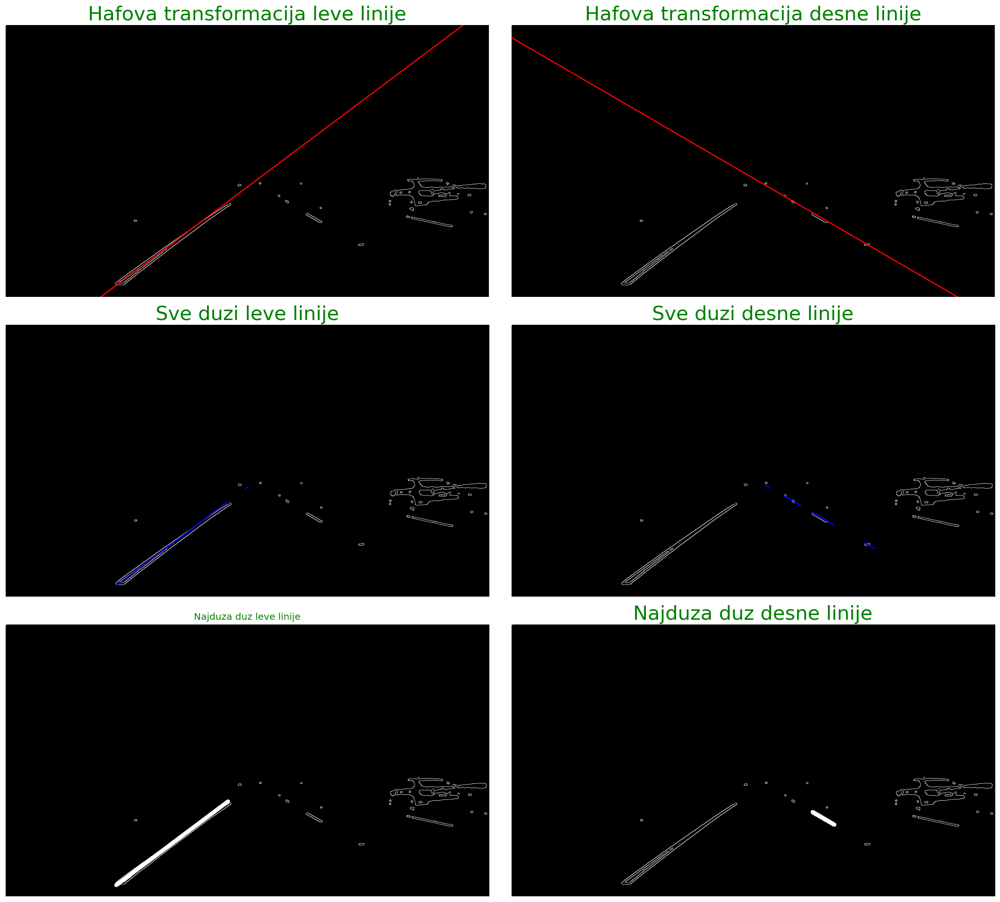

In [368]:
for i in range(0,6):
    print(str(i+1)+'. test frejm')
    f=img_as_float(imread('../sekvence/test_frames/test'+str(i+1)+'.jpg'))
    pocetak,kraj=lane_detection(f)
    

Prikaz konačnog rezultata na svim test slikama

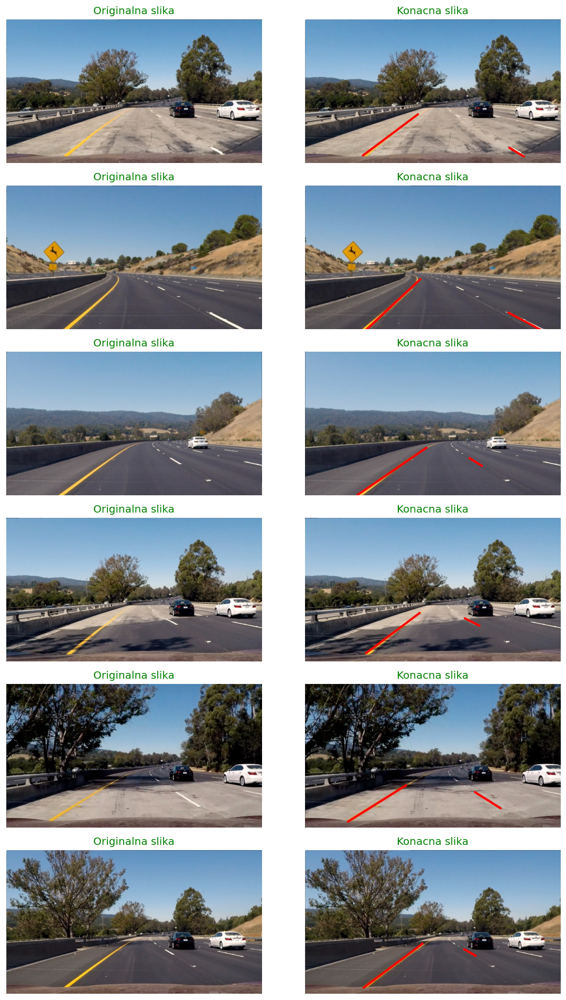

In [342]:
figure, ax=subplots(nrows=6,ncols=2,figsize=(10,16),dpi=120)
for i in range(0,6):
    f=img_as_float(imread('../sekvence/test_frames/test'+str(i+1)+'.jpg'))
    pocetak,kraj=lane_detection(f)
    
    #iscrtavanje leve linije
    dot1=(int64(pocetak[0,0]),int64(pocetak[0,1]))
    dot2=(int64(kraj[0,0]),int64(kraj[0,1]))
    e=cv2.line(f*255, dot1, dot2, (255,0,0), 10)

    #iscrtavanje desne linije
    dot1=(int64(pocetak[1,0]),int64(pocetak[1,1]))
    dot2=(int64(kraj[1,0]),int64(kraj[1,1]))
    e=cv2.line(e, dot1, dot2, (255,0,0), 10)
    e_copy=np.uint8(e)
    ax[i,0].imshow(f, cmap='gray', vmin=0, vmax=1), ax[i,0].set_title('Originalna slika', color='green'), ax[i,0].axis('off')
    ax[i,1].imshow(e_copy, cmap='gray', vmin=0, vmax=255), ax[i,1].set_title('Konacna slika', color='green'), ax[i,1].axis('off')
    matplotlib.pyplot.tight_layout()

Prikaz vremena izvršenja svih funkcija

In [348]:
f=img_as_float(imread('../sekvence/test_frames/test'+str(1)+'.jpg'))
pocetak,kraj=lane_detection(f)   


Vreme izvrsavanja fje segment_lanes: 4.552s 


Vreme izvrsavanja Kani fje: 2.774s 


Vreme izvrsavanja get_line_segments: 0.032s 


Vreme izvrsavanja get_line_segments: 0.039s 


Vreme izvrsavanja fje lane_detection: 8.429s 



Na kraju potrebno je izvršiti obradu videa. Iz videa se prvo ekstraktuju svi frejmovi, a zatim se na svaki od tih frejmova primeni funkcija lane_detection(). Dobijene linije se iscrtaju na frejm i na kraju se svi ti frejmovi sklope u jedan snimak.

In [ ]:
#pravljenje objekta od videa
videoObj=cv2.VideoCapture('C:/Users/nikol/Desktop/Projekti/ETF/DOS(elektronika)/Domaci/Zadatak 3/video_road.mp4')

#citanje frejmova iz toka objekta
try:
    if not os.path.exists('data'):
        os.makedirs('data')
    
    if not os.path.exists('processedData_short1'):
        os.makedirs('processedData_short1')
        
except OSError:
    print('Greska pri pravljenju foldera data!')
    
currentframe=0

while(1):
    ret, frame=videoObj.read()
    
    if ret:
        name='./data/frame'+str(currentframe)+'.jpg'
        cv2.imwrite(name, frame)
        currentframe+=1
        
    else:
        break
        
videoObj.release()
cv2.destroyAllWindows()

#iscrtavnje linija na slikama
for i in range(0,currentframe):
    f=img_as_float(imread('data/frame'+str(i)+'.jpg'))
    name_processedData='./processedData_short1/frame'+str(i)+'.jpg'
    pocetak,kraj=lane_detection(f)
    
    #iscrtavanje leve linije
    x=(kraj[0,0]-pocetak[0,0])/(kraj[0,1]-pocetak[0,1])*(460-pocetak[0,1])+pocetak[0,0]
    dot1=(int64(pocetak[0,0]),int64(pocetak[0,1]))
    #dot2=(int64(kraj[0,0]),int64(kraj[0,1]))
    dot2=(int64(x),460)
    e=cv2.line(f*255, dot1, dot2, (255,0,0), 10)

    #iscrtavanje desne linije
    x=(kraj[1,0]-pocetak[1,0])/(kraj[1,1]-pocetak[1,1])*(460-pocetak[1,1])+pocetak[1,0]
    if(np.isnan(x)): #ovo ce biti kada nema desne linije
        dot1=(int64(pocetak[1,0]),int64(pocetak[1,1]))
    else:
        dot1=(int64(pocetak[1,0]),int64(pocetak[1,1]))
        #dot1=(int64(x),460)
    dot2=(int64(kraj[1,0]),int64(kraj[1,1]))
    e=cv2.line(e, dot1, dot2, (255,0,0), 10)

    e_copy=np.uint8(e)
    e_bgr= cv2.cvtColor(e_copy, cv2.COLOR_RGB2BGR)
    #cuvanje slike
    cv2.imwrite(name_processedData,  e_bgr)



Pravljenje snimka od izmenjenih frejmova

In [150]:
#stvaranje videa
video_name='processed_road_short1.mp4'
frame=img_as_float(imread('data/frame'+str(0)+'.jpg'))
height,width,layers=frame.shape

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video=cv2.VideoWriter(video_name,fourcc,25.0,(width,height))

for i in range(0,1252):
    #definisanje apsolutne putanje
    absolute_path = os.path.join(os.getcwd(), 'processedData_short1', 'frame'+str(i)+'.jpg');
    #citanje jednog frejma
    frame=cv2.imread(absolute_path)
    #dodavanje frejma na vec postojece
    video.write(frame)

video.release()
cv2.destroyAllWindows()
